In [9]:
#  set dataset path  
from pathlib import Path

DATASET_PATH = Path("/kaggle/input/plantvillage-tomato-leaf-dataset/plantvillage/plantvillage")
 
assert DATASET_PATH.exists(), f"Dataset path not found: {DATASET_PATH}"
print("Dataset path is set to:", DATASET_PATH)


Dataset path is set to: /kaggle/input/plantvillage-tomato-leaf-dataset/plantvillage/plantvillage


In [10]:
#  stratified train/val/test split  
from pathlib import Path
from sklearn.model_selection import train_test_split
import shutil
import random
import pandas as pd

random.seed(42)

SRC = DATASET_PATH   
OUT = Path("/kaggle/working/data_split")
TRAIN_PCT = 0.70
VAL_PCT = 0.15
TEST_PCT = 0.15

# cleanup/create folders
if OUT.exists():
    print(f"Output folder {OUT} already exists — reusing (files already copied will be kept).")
OUT.mkdir(parents=True, exist_ok=True)
for split in ["train", "val", "test"]:
    (OUT / split).mkdir(exist_ok=True)

# gather class-wise file lists
classes = sorted([p.name for p in SRC.iterdir() if p.is_dir()])
file_index = {}
for cls in classes:
    files = list((SRC/cls).glob("*"))
    files = [f for f in files if f.is_file()]
    file_index[cls] = files

# perform stratified split per class and copy files
counts = {"class":[], "train":[], "val":[], "test":[]}
for cls, files in file_index.items():
    n = len(files)
    if n == 0:
        continue
    train_files, temp_files = train_test_split(files, train_size=TRAIN_PCT, random_state=42, shuffle=True)
    # temp split into val/test equally so each gets 15% overall
    val_files, test_files = train_test_split(temp_files, train_size=VAL_PCT/(VAL_PCT+TEST_PCT), random_state=42, shuffle=True)
    # create class subfolders
    for split_name, split_files in [("train", train_files), ("val", val_files), ("test", test_files)]:
        dest_dir = OUT / split_name / cls
        dest_dir.mkdir(parents=True, exist_ok=True)
        for f in split_files:
            dest = dest_dir / f.name
            if not dest.exists():
                shutil.copy2(f, dest)
    counts["class"].append(cls)
    counts["train"].append(len(train_files))
    counts["val"].append(len(val_files))
    counts["test"].append(len(test_files))

# summary table of counts per class and totals
df_counts = pd.DataFrame(counts)
df_counts["total"] = df_counts[["train","val","test"]].sum(axis=1)
totals = df_counts[["train","val","test","total"]].sum().rename("TOTAL")
display(df_counts.set_index("class"))
print("\nOverall totals:")
print(totals)

# show one sample train file per class  
print("\nSample train file per class:")
for cls in df_counts["class"]:
    p = next((OUT/"train"/cls).glob("*"), None)
    print(cls, "->", p.name if p is not None else "NONE")


Output folder /kaggle/working/data_split already exists — reusing (files already copied will be kept).


,train,val,test,total
class,,,,
Tomato___Bacterial_spot,1191,255,256,1702
Tomato___Early_blight,560,120,120,800
Tomato___Late_blight,1068,229,230,1527
Tomato___Leaf_Mold,532,114,115,761
Tomato___Septoria_leaf_spot,991,213,213,1417
Tomato___Spider_mites Two-spotted_spider_mite,938,201,202,1341
Tomato___Target_Spot,786,168,169,1123
Tomato___Tomato_Yellow_Leaf_Curl_Virus,3000,643,643,4286
Tomato___Tomato_mosaic_virus,209,45,45,299



Overall totals:
train    10166
val       2179
test      2184
total    14529
Name: TOTAL, dtype: int64

Sample train file per class:
Tomato___Bacterial_spot -> 4913ff90-0ca7-43b5-a157-a8ab19e43f12___UF.GRC_BS_Lab Leaf 0537.JPG
Tomato___Early_blight -> b45de15f-76b6-46bf-9990-e819dbef21d1___RS_Erly.B 9491.JPG
Tomato___Late_blight -> 5614e19d-53b7-4509-98e3-478712039c80___GHLB2 Leaf 8997.JPG
Tomato___Leaf_Mold -> b7b05e98-5432-43a1-94e7-e1d6146faf18___Crnl_L.Mold 6912.JPG
Tomato___Septoria_leaf_spot -> ab242fd5-a0d8-4080-b2e1-15bc475c13c0___JR_Sept.L.S 2713.JPG
Tomato___Spider_mites Two-spotted_spider_mite -> 46906f6d-1795-4690-a1cc-01b1554d97ca___Com.G_SpM_FL 9452.JPG
Tomato___Target_Spot -> e472ae89-ddc8-4db3-a752-3faeea3c0933___Com.G_TgS_FL 8260.JPG
Tomato___Tomato_Yellow_Leaf_Curl_Virus -> 1fc81b3a-b368-40d7-a2fd-ba6bbea7530d___UF.GRC_YLCV_Lab 09456.JPG
Tomato___Tomato_mosaic_virus -> 629e19d4-c6f5-457f-9e17-80a1e77140fe___PSU_CG 2129.JPG
Tomato___healthy -> 0764ce38-ecb9-4046-88d9-c

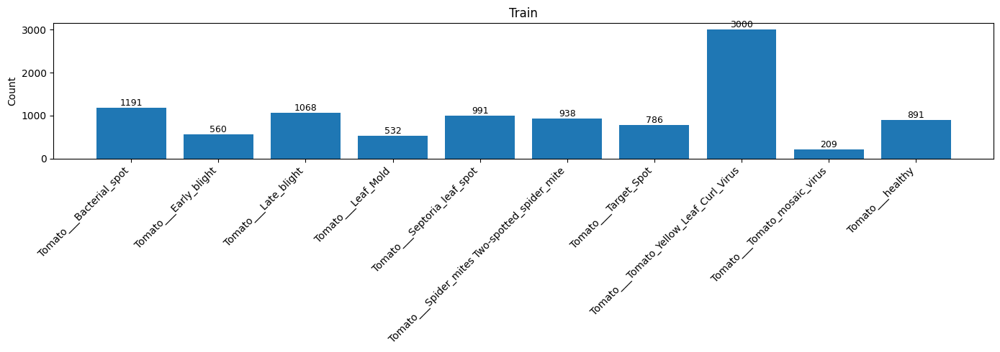

Classes and counts:
Tomato___Bacterial_spot: 1191
Tomato___Early_blight: 560
Tomato___Late_blight: 1068
Tomato___Leaf_Mold: 532
Tomato___Septoria_leaf_spot: 991
Tomato___Spider_mites Two-spotted_spider_mite: 938
Tomato___Target_Spot: 786
Tomato___Tomato_Yellow_Leaf_Curl_Virus: 3000
Tomato___Tomato_mosaic_virus: 209
Tomato___healthy: 891


In [11]:
#  bar images class

import os
import matplotlib.pyplot as plt
import numpy as np

split_path = Path("/kaggle/working/data_split/train")

class_names = sorted([d.name for d in split_path.iterdir() if d.is_dir()])
class_counts = [len(list((split_path/d).glob("*"))) for d in class_names]

plt.figure(figsize=(14,5))
bars = plt.bar(class_names, class_counts)

 
for bar, count in zip(bars, class_counts):
    plt.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height(),
        str(count),
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.xticks(rotation=45, ha='right')
plt.title("Train")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

print("Classes and counts:")
for cls, count in zip(class_names, class_counts):
    print(f"{cls}: {count}")


Found 10166 images belonging to 10 classes.
Found 2179 images belonging to 10 classes.
Found 2184 images belonging to 10 classes.
Class indices: {'Tomato___Bacterial_spot': 0, 'Tomato___Early_blight': 1, 'Tomato___Late_blight': 2, 'Tomato___Leaf_Mold': 3, 'Tomato___Septoria_leaf_spot': 4, 'Tomato___Spider_mites Two-spotted_spider_mite': 5, 'Tomato___Target_Spot': 6, 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 7, 'Tomato___Tomato_mosaic_virus': 8, 'Tomato___healthy': 9}


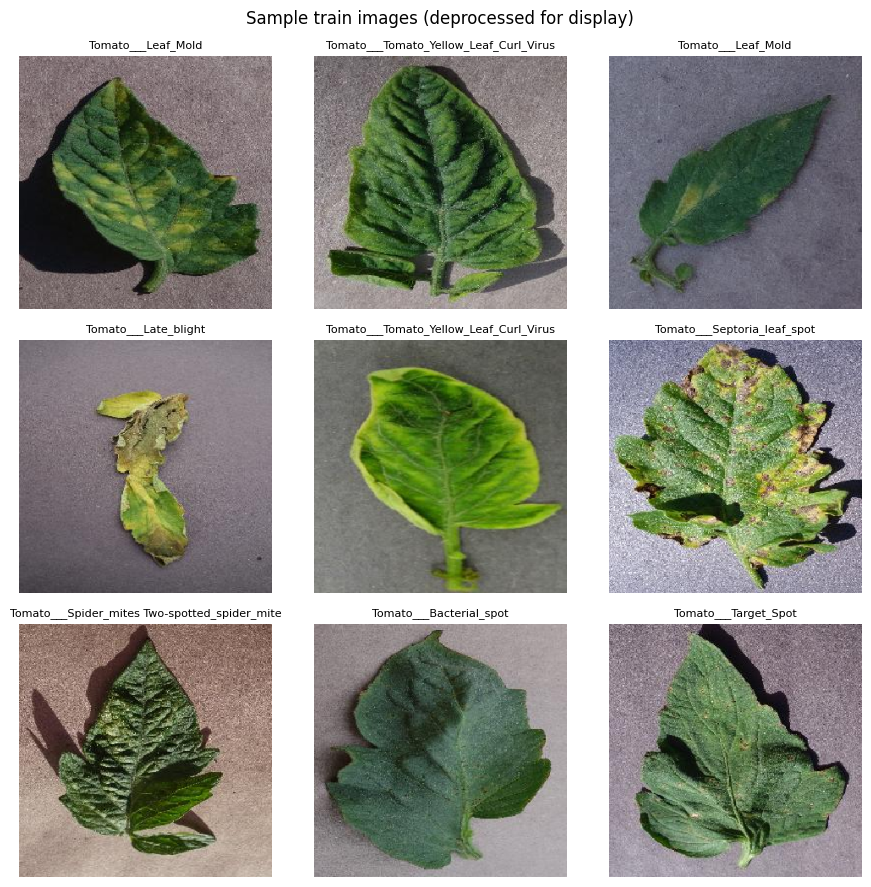

Augmentation sample file: /kaggle/working/data_split/train/Tomato___Bacterial_spot/0045ba29-ed1b-43b4-afde-719cc7adefdb___GCREC_Bact.Sp 6254.JPG


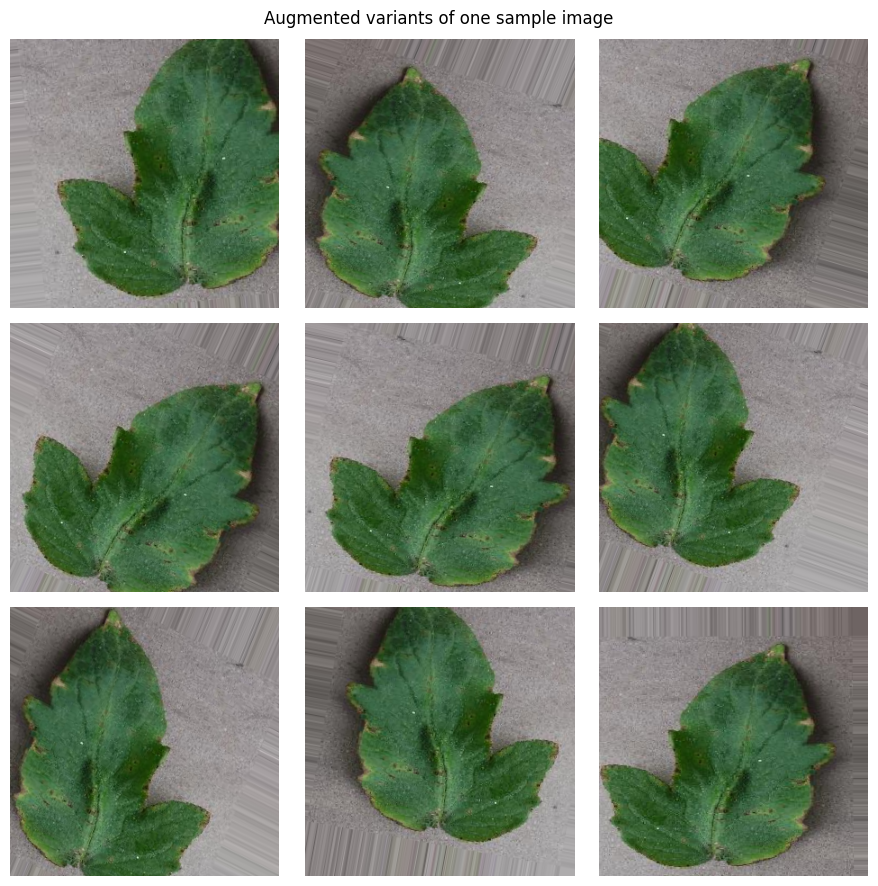

Reference session file path: /mnt/data/download.png


In [12]:
#    InceptionV3 preprocessing show sample train images and correct augmentation demo
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"   
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications.inception_v3 import preprocess_input

# further silence TF logger
tf.get_logger().setLevel('ERROR')

# Paths and params
TRAIN_DIR = Path("/kaggle/working/data_split/train")
VAL_DIR   = Path("/kaggle/working/data_split/val")
TEST_DIR  = Path("/kaggle/working/data_split/test")
TARGET_SIZE = (299, 299)   
BATCH_SIZE = 32
SEED = 42

# Reproducibility
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Generators for training/validation/testing  
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
val_datagen   = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen  = ImageDataGenerator(preprocessing_function=preprocess_input)

train_gen = train_datagen.flow_from_directory(
    directory=str(TRAIN_DIR),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

val_gen = val_datagen.flow_from_directory(
    directory=str(VAL_DIR),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=SEED
)

test_gen = test_datagen.flow_from_directory(
    directory=str(TEST_DIR),
    target_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=SEED
)

print("Class indices:", train_gen.class_indices)

#    Inception-preprocessed images  
def deprocess_inception(x):
    
    x = (x + 1.0) / 2.0
    return np.clip(x, 0.0, 1.0)

# Show a grid of sample train images (deprocessed for display)
x_batch, y_batch = next(train_gen)
n_show = min(9, x_batch.shape[0])
plt.figure(figsize=(9,9))
for i in range(n_show):
    ax = plt.subplot(3,3,i+1)
    img = deprocess_inception(x_batch[i])
    plt.imshow(img)
    label_idx = np.argmax(y_batch[i])
    label_name = [k for k,v in train_gen.class_indices.items() if v == label_idx][0]
    plt.title(label_name, fontsize=8)
    plt.axis('off')
plt.suptitle("Sample train images (deprocessed for display)")
plt.tight_layout()
plt.show()

# --- Correct augmentation demonstration ---
 

aug_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=25,
    width_shift_range=0.12,
    height_shift_range=0.12,
    shear_range=0.12,
    zoom_range=0.12,
    horizontal_flip=True,
    fill_mode='nearest'
)

# find one sample image file path for demonstration
sample_rel = next(iter(train_gen.filenames)) 
sample_path = TRAIN_DIR / sample_rel
print("Augmentation sample file:", sample_path)

# load raw image (PIL) and resize to target size, convert to array 
raw_img = load_img(str(sample_path), target_size=TARGET_SIZE)
raw_arr = img_to_array(raw_img)   
raw_batch = np.expand_dims(raw_arr, axis=0)

# create augmentation iterator  
aug_iter = aug_datagen.flow(raw_batch, batch_size=1, seed=SEED)

# display several augmented variants 
plt.figure(figsize=(9,9))
for i in range(9):
    aug_img = next(aug_iter)[0]       
    aug_img_disp = deprocess_inception(aug_img)
    ax = plt.subplot(3,3,i+1)
    plt.imshow(aug_img_disp)
    plt.axis('off')
plt.suptitle("Augmented variants of one sample image")
plt.tight_layout()
plt.show()

 
print("Reference session file path:", "/mnt/data/download.png")


In [13]:
#  Build InceptionV3 model   

from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

NUM_CLASSES = train_gen.num_classes

# Load base model without top layer
base_model = InceptionV3(
    weights='imagenet',
    include_top=False,
    input_shape=(299, 299, 3)
)

# Freeze base model
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
output = Dense(NUM_CLASSES, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Print summary
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_94 (Conv2D)  │ (None, 149, 149,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 149, 149,  │         96 │ conv2d_94[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_94       │ (None, 149, 149,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_95 (Conv2D)  │ (None, 147, 147,  │      9,216 │ activation_94[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │         96 │ conv2d_95[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_95       │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_96 (Conv2D)  │ (None, 147, 147,  │     18,432 │ activation_95[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │        192 │ conv2d_96[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_96       │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 73, 73,    │          0 │ activation_96[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_97 (Conv2D)  │ (None, 73, 73,    │      5,120 │ max_pooling2d_4[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 73, 73,    │        240 │ conv2d_97[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_97       │ (None, 73, 73,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_98 (Conv2D)  │ (None, 71, 71,    │    138,240 │ activation_97[0]… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 71, 71,    │        576 │ conv2d_98[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_98       │ (None, 71, 71,    │          0 │ batch_normalizat

 Total params: 21,823,274 (83.25 MB)

 Trainable params: 20,490 (80.04 KB)

 Non-trainable params: 21,802,784 (83.17 MB)

Epoch 1/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.3404 - loss: 1.9592

318/318 ━━━━━━━━━━━━━━━━━━━━ 75s 203ms/step - accuracy: 0.3407 - loss: 1.9585 - val_accuracy: 0.6030 - val_loss: 1.3356 - learning_rate: 1.0000e-04
Epoch 2/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5844 - loss: 1.3313

318/318 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - accuracy: 0.5845 - loss: 1.3310 - val_accuracy: 0.7100 - val_loss: 1.0457 - learning_rate: 1.0000e-04
Epoch 3/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - accuracy: 0.6784 - loss: 1.0656

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - accuracy: 0.6785 - loss: 1.0655 - val_accuracy: 0.7563 - val_loss: 0.8859 - learning_rate: 1.0000e-04
Epoch 4/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.7261 - loss: 0.9230

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.7261 - loss: 0.9229 - val_accuracy: 0.7871 - val_loss: 0.7873 - learning_rate: 1.0000e-04
Epoch 5/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.7568 - loss: 0.8129

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - accuracy: 0.7568 - loss: 0.8129 - val_accuracy: 0.8022 - val_loss: 0.7181 - learning_rate: 1.0000e-04
Epoch 6/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.7748 - loss: 0.7511

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.7748 - loss: 0.7511 - val_accuracy: 0.8086 - val_loss: 0.6677 - learning_rate: 1.0000e-04
Epoch 7/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.7818 - loss: 0.7066

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - accuracy: 0.7819 - loss: 0.7065 - val_accuracy: 0.8334 - val_loss: 0.6228 - learning_rate: 1.0000e-04
Epoch 8/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8016 - loss: 0.6668

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - accuracy: 0.8016 - loss: 0.6667 - val_accuracy: 0.8394 - val_loss: 0.5898 - learning_rate: 1.0000e-04
Epoch 9/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8145 - loss: 0.6188

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - accuracy: 0.8145 - loss: 0.6188 - val_accuracy: 0.8453 - val_loss: 0.5624 - learning_rate: 1.0000e-04
Epoch 10/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8192 - loss: 0.5998

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8192 - loss: 0.5998 - val_accuracy: 0.8536 - val_loss: 0.5366 - learning_rate: 1.0000e-04
Epoch 11/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8274 - loss: 0.5715

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8274 - loss: 0.5715 - val_accuracy: 0.8577 - val_loss: 0.5157 - learning_rate: 1.0000e-04
Epoch 12/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8330 - loss: 0.5561

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8330 - loss: 0.5561 - val_accuracy: 0.8628 - val_loss: 0.4980 - learning_rate: 1.0000e-04
Epoch 13/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8451 - loss: 0.5311

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8451 - loss: 0.5311 - val_accuracy: 0.8642 - val_loss: 0.4848 - learning_rate: 1.0000e-04
Epoch 14/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8470 - loss: 0.5163

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8470 - loss: 0.5163 - val_accuracy: 0.8619 - val_loss: 0.4713 - learning_rate: 1.0000e-04
Epoch 15/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8497 - loss: 0.4864

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8497 - loss: 0.4864 - val_accuracy: 0.8660 - val_loss: 0.4570 - learning_rate: 1.0000e-04
Epoch 16/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8503 - loss: 0.4849

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8503 - loss: 0.4849 - val_accuracy: 0.8710 - val_loss: 0.4463 - learning_rate: 1.0000e-04
Epoch 17/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8599 - loss: 0.4739

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8599 - loss: 0.4739 - val_accuracy: 0.8701 - val_loss: 0.4380 - learning_rate: 1.0000e-04
Epoch 18/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8596 - loss: 0.4689

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8596 - loss: 0.4689 - val_accuracy: 0.8724 - val_loss: 0.4256 - learning_rate: 1.0000e-04
Epoch 19/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8611 - loss: 0.4548

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8611 - loss: 0.4548 - val_accuracy: 0.8784 - val_loss: 0.4156 - learning_rate: 1.0000e-04
Epoch 20/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8729 - loss: 0.4342

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8729 - loss: 0.4343 - val_accuracy: 0.8752 - val_loss: 0.4122 - learning_rate: 1.0000e-04
Epoch 21/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8694 - loss: 0.4276

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - accuracy: 0.8694 - loss: 0.4276 - val_accuracy: 0.8866 - val_loss: 0.4028 - learning_rate: 1.0000e-04
Epoch 22/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8758 - loss: 0.4281

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - accuracy: 0.8758 - loss: 0.4281 - val_accuracy: 0.8853 - val_loss: 0.3929 - learning_rate: 1.0000e-04
Epoch 23/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8786 - loss: 0.4036

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - accuracy: 0.8786 - loss: 0.4036 - val_accuracy: 0.8853 - val_loss: 0.3880 - learning_rate: 1.0000e-04
Epoch 24/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8779 - loss: 0.3998

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8779 - loss: 0.3998 - val_accuracy: 0.8899 - val_loss: 0.3823 - learning_rate: 1.0000e-04
Epoch 25/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8757 - loss: 0.4081

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8757 - loss: 0.4081 - val_accuracy: 0.8931 - val_loss: 0.3752 - learning_rate: 1.0000e-04
Epoch 26/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - accuracy: 0.8806 - loss: 0.3940 - val_accuracy: 0.8917 - val_loss: 0.3758 - learning_rate: 1.0000e-04
Epoch 27/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8806 - loss: 0.3855

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8806 - loss: 0.3855 - val_accuracy: 0.8931 - val_loss: 0.3665 - learning_rate: 1.0000e-04
Epoch 28/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8834 - loss: 0.3885

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8834 - loss: 0.3884 - val_accuracy: 0.8935 - val_loss: 0.3615 - learning_rate: 1.0000e-04
Epoch 29/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8839 - loss: 0.3831

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8839 - loss: 0.3831 - val_accuracy: 0.8963 - val_loss: 0.3572 - learning_rate: 1.0000e-04
Epoch 30/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8906 - loss: 0.3702

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8906 - loss: 0.3702 - val_accuracy: 0.8922 - val_loss: 0.3554 - learning_rate: 1.0000e-04
Epoch 31/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8866 - loss: 0.3689

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8866 - loss: 0.3689 - val_accuracy: 0.8958 - val_loss: 0.3496 - learning_rate: 1.0000e-04
Epoch 32/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8981 - loss: 0.3439

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8980 - loss: 0.3440 - val_accuracy: 0.8949 - val_loss: 0.3456 - learning_rate: 1.0000e-04
Epoch 33/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8882 - loss: 0.3576

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8882 - loss: 0.3576 - val_accuracy: 0.8935 - val_loss: 0.3448 - learning_rate: 1.0000e-04
Epoch 34/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8900 - loss: 0.3588

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8900 - loss: 0.3588 - val_accuracy: 0.8981 - val_loss: 0.3387 - learning_rate: 1.0000e-04
Epoch 35/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8885 - loss: 0.3541

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8885 - loss: 0.3540 - val_accuracy: 0.8977 - val_loss: 0.3361 - learning_rate: 1.0000e-04
Epoch 36/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8922 - loss: 0.3536

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - accuracy: 0.8922 - loss: 0.3536 - val_accuracy: 0.8981 - val_loss: 0.3332 - learning_rate: 1.0000e-04
Epoch 37/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - accuracy: 0.8959 - loss: 0.3380 - val_accuracy: 0.8986 - val_loss: 0.3335 - learning_rate: 1.0000e-04
Epoch 38/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8973 - loss: 0.3433

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8973 - loss: 0.3433 - val_accuracy: 0.8995 - val_loss: 0.3299 - learning_rate: 1.0000e-04
Epoch 39/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9013 - loss: 0.3367

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.9013 - loss: 0.3367 - val_accuracy: 0.9009 - val_loss: 0.3254 - learning_rate: 1.0000e-04
Epoch 40/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8970 - loss: 0.3336

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - accuracy: 0.8970 - loss: 0.3336 - val_accuracy: 0.9027 - val_loss: 0.3234 - learning_rate: 1.0000e-04
Epoch 41/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9026 - loss: 0.3260

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - accuracy: 0.9026 - loss: 0.3260 - val_accuracy: 0.9013 - val_loss: 0.3201 - learning_rate: 1.0000e-04
Epoch 42/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8932 - loss: 0.3332

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.8932 - loss: 0.3332 - val_accuracy: 0.9000 - val_loss: 0.3193 - learning_rate: 1.0000e-04
Epoch 43/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9009 - loss: 0.3196

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.9009 - loss: 0.3196 - val_accuracy: 0.8986 - val_loss: 0.3169 - learning_rate: 1.0000e-04
Epoch 44/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9034 - loss: 0.3153

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.9034 - loss: 0.3153 - val_accuracy: 0.9064 - val_loss: 0.3115 - learning_rate: 1.0000e-04
Epoch 45/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9078 - loss: 0.3113

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.9078 - loss: 0.3113 - val_accuracy: 0.9045 - val_loss: 0.3106 - learning_rate: 1.0000e-04
Epoch 46/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - accuracy: 0.9077 - loss: 0.3083 - val_accuracy: 0.9036 - val_loss: 0.3120 - learning_rate: 1.0000e-04
Epoch 47/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9084 - loss: 0.3066

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - accuracy: 0.9084 - loss: 0.3066 - val_accuracy: 0.9073 - val_loss: 0.3064 - learning_rate: 1.0000e-04
Epoch 48/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9015 - loss: 0.3176

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - accuracy: 0.9015 - loss: 0.3175 - val_accuracy: 0.9022 - val_loss: 0.3063 - learning_rate: 1.0000e-04
Epoch 49/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - accuracy: 0.9070 - loss: 0.3149

318/318 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - accuracy: 0.9070 - loss: 0.3149 - val_accuracy: 0.9068 - val_loss: 0.3038 - learning_rate: 1.0000e-04
Epoch 50/50
318/318 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.9101 - loss: 0.3076

318/318 ━━━━━━━━━━━━━━━━━━━━ 52s 162ms/step - accuracy: 0.9101 - loss: 0.3075 - val_accuracy: 0.9078 - val_loss: 0.3011 - learning_rate: 1.0000e-04


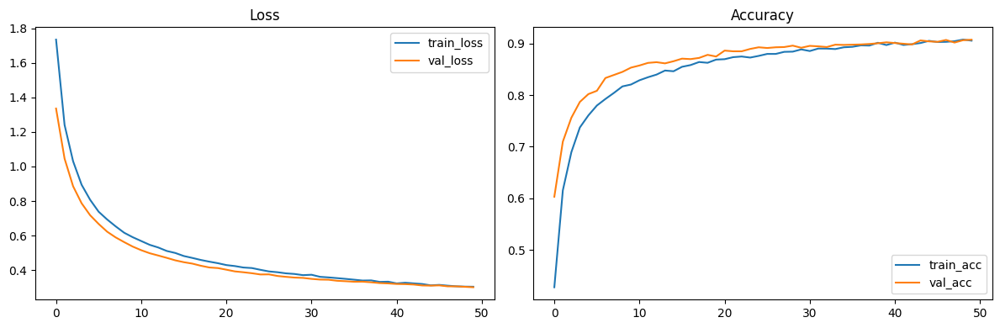

In [14]:
#   training + evaluation

import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"  

import warnings
warnings.filterwarnings("ignore")

# Disable TF logging completely
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
tf.autograph.set_verbosity(0)

import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

EPOCHS = 50
PATIENCE = 6
BATCH_SIZE = 32
MODEL_OUT = Path("/kaggle/working/best_inceptionv3.h5")

train_steps = math.ceil(train_gen.samples / BATCH_SIZE)
val_steps   = math.ceil(val_gen.samples  / BATCH_SIZE)
test_steps  = math.ceil(test_gen.samples / BATCH_SIZE)

callbacks = [
    EarlyStopping(monitor="val_loss", patience=PATIENCE, restore_best_weights=True, verbose=0),
    ModelCheckpoint(str(MODEL_OUT), monitor="val_loss", save_best_only=True, verbose=0),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, verbose=0)
]

history = model.fit(
    train_gen,
    steps_per_epoch=train_steps,
    validation_data=val_gen,
    validation_steps=val_steps,
    epochs=EPOCHS,
    verbose=1,
    callbacks=callbacks
)

# ---------- PLOTS ----------
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.plot(history.history["loss"], label="train_loss")
plt.plot(history.history["val_loss"], label="val_loss")
plt.title("Loss")
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history["accuracy"], label="train_acc")
plt.plot(history.history["val_accuracy"], label="val_acc")
plt.title("Accuracy")
plt.legend()
plt.tight_layout()
plt.show()






In [15]:
#   Classification  

import numpy as np
from sklearn.metrics import classification_report, f1_score

# predictions
y_proba = model.predict(test_gen, verbose=0)
y_pred  = np.argmax(y_proba, axis=1)
y_true  = test_gen.classes

# class names
inv_map = {v:k for k,v in test_gen.class_indices.items()}
class_names = [inv_map[i] for i in range(len(inv_map))]

# classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

# F1 score (macro)
macro_f1 = f1_score(y_true, y_pred, average='macro')
print(f"Macro F1 Score: {macro_f1:.4f}")



Classification Report:

                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot     0.8525    0.9258    0.8876       256
                        Tomato___Early_blight     0.8495    0.6583    0.7418       120
                         Tomato___Late_blight     0.8780    0.9391    0.9076       230
                           Tomato___Leaf_Mold     0.8624    0.8174    0.8393       115
                  Tomato___Septoria_leaf_spot     0.8443    0.8404    0.8424       213
Tomato___Spider_mites Two-spotted_spider_mite     0.8732    0.8861    0.8796       202
                         Tomato___Target_Spot     0.7284    0.6982    0.7130       169
       Tomato___Tomato_Yellow_Leaf_Curl_Virus     0.9798    0.9829    0.9814       643
                 Tomato___Tomato_mosaic_virus     0.9268    0.8444    0.8837        45
                             Tomato___healthy     0.9275    0.9372    0.9323       191

                

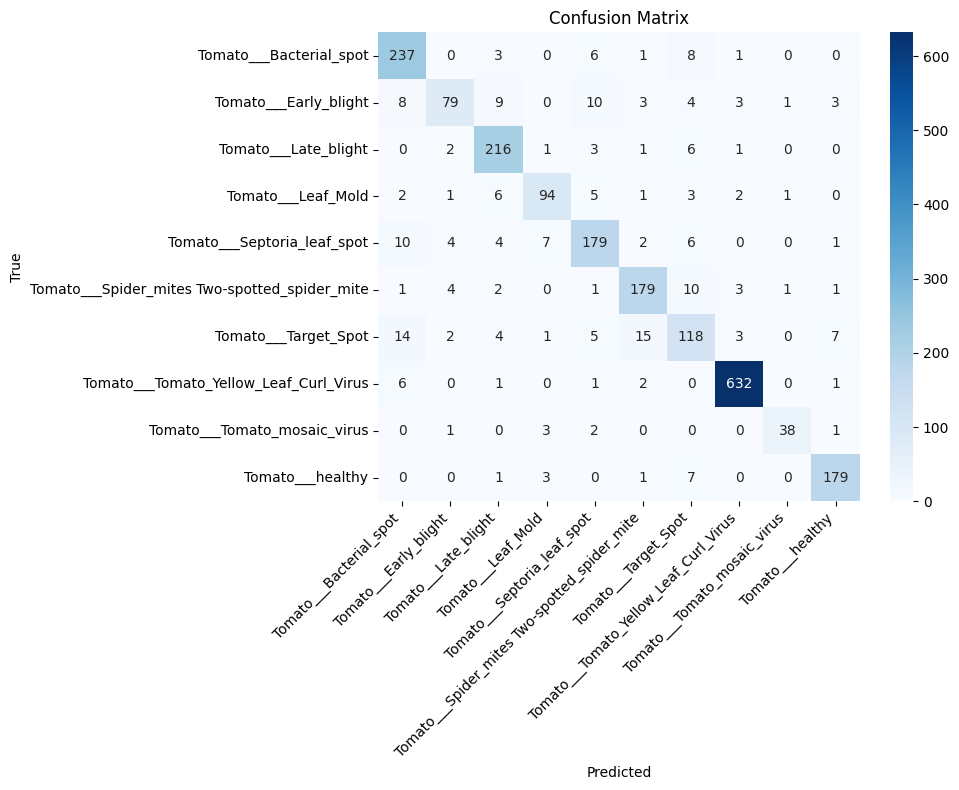

In [16]:
#  Confusion Matrix 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# predictions
y_proba = model.predict(test_gen, verbose=0)
y_pred  = np.argmax(y_proba, axis=1)
y_true  = test_gen.classes

# class names
inv_map = {v:k for k,v in test_gen.class_indices.items()}
class_names = [inv_map[i] for i in range(len(inv_map))]

# confusion matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10,8))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


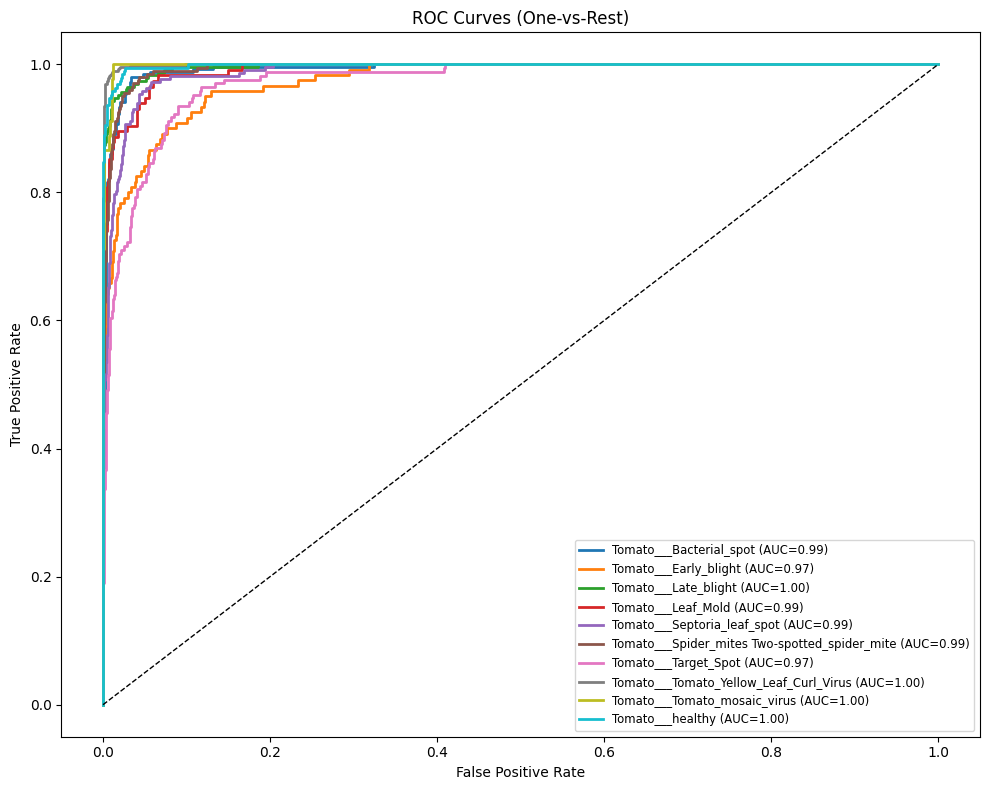

In [17]:
#  ROC Curve  

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

# predictions
y_proba = model.predict(test_gen, verbose=0)
y_pred  = np.argmax(y_proba, axis=1)
y_true  = test_gen.classes

# class names
inv_map = {v:k for k,v in test_gen.class_indices.items()}
class_names = [inv_map[i] for i in range(len(inv_map))]

# binarize true labels (one-vs-rest)
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))
n_classes = len(class_names)

plt.figure(figsize=(10,8))

for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"{class_names[i]} (AUC={roc_auc:.2f})")

plt.plot([0,1], [0,1], 'k--', lw=1)
plt.title("ROC Curves (One-vs-Rest)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(fontsize="small")
plt.tight_layout()
plt.show()


Total misclassified samples: 233


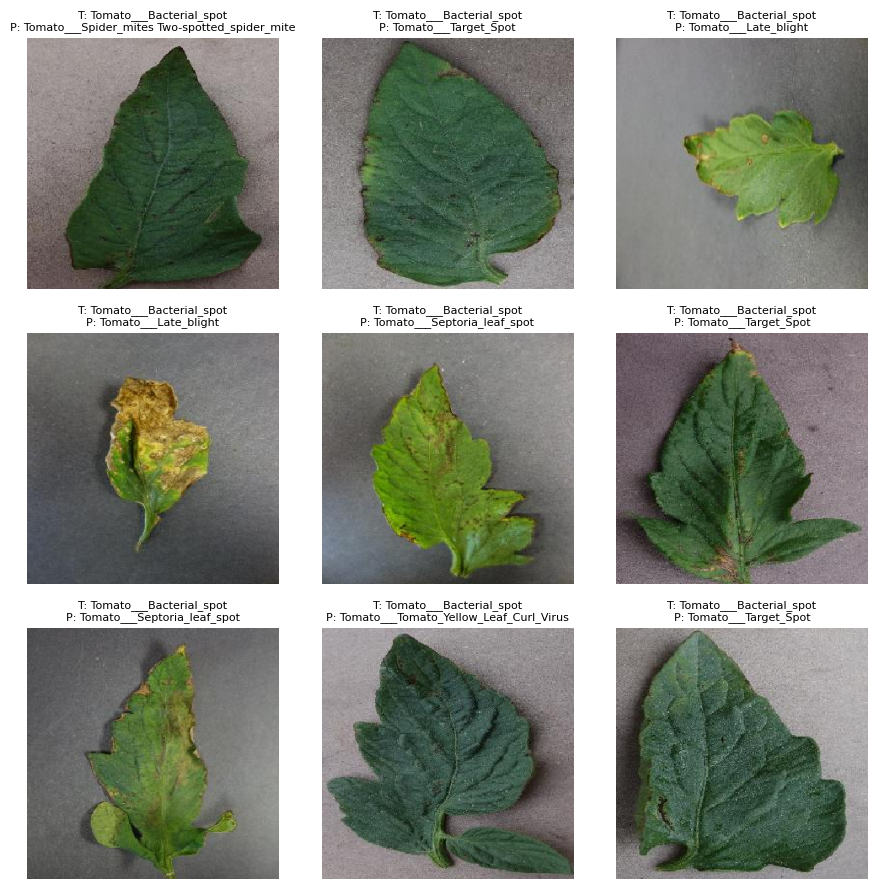

In [18]:
#  Misclassified Samples 

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf

# predictions
y_proba = model.predict(test_gen, verbose=0)
y_pred  = np.argmax(y_proba, axis=1)
y_true  = test_gen.classes

# class names
inv_map = {v:k for k,v in test_gen.class_indices.items()}
class_names = [inv_map[i] for i in range(len(inv_map))]

# find misclassified
mis_idx = np.where(y_pred != y_true)[0]
print("Total misclassified samples:", len(mis_idx))

if len(mis_idx) == 0:
    print("No misclassified samples found.")
else:
    n_show = min(9, len(mis_idx))
    plt.figure(figsize=(9,9))

    for i, idx in enumerate(mis_idx[:n_show]):
        ax = plt.subplot(3,3,i+1)
        fname = test_gen.filenames[idx]
        img_path = Path(test_gen.directory) / fname

        img = tf.keras.preprocessing.image.load_img(str(img_path), target_size=(299,299))
        arr = tf.keras.preprocessing.image.img_to_array(img) / 255.0

        plt.imshow(arr)
        plt.title(f"T: {inv_map[y_true[idx]]}\nP: {inv_map[y_pred[idx]]}", fontsize=8)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


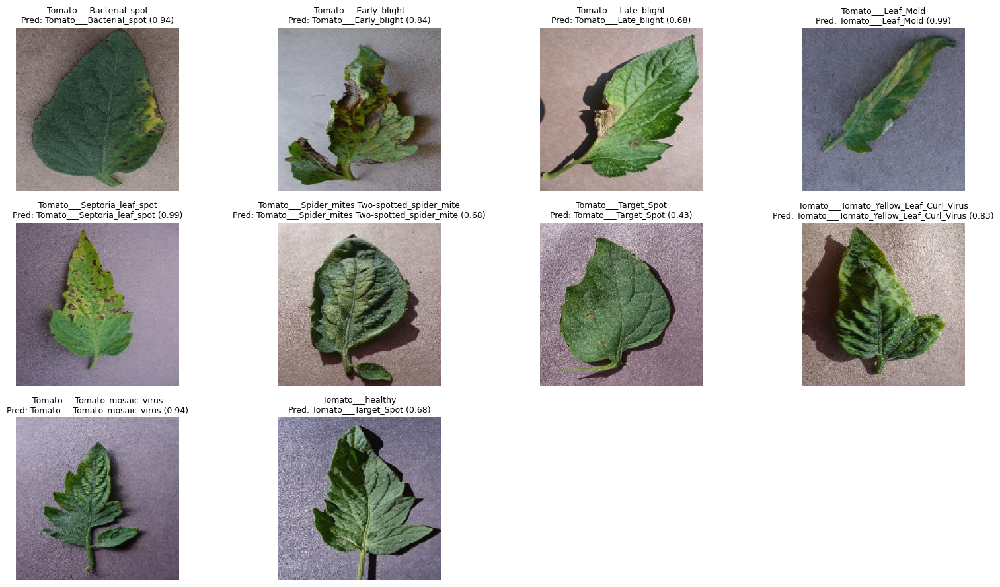

In [20]:
# sample per class  
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.inception_v3 import preprocess_input

inv_map = {v:k for k,v in test_gen.class_indices.items()}
class_names = [inv_map[i] for i in range(len(inv_map))]

# layout
n_cols = 4
n_rows = (len(class_names) + n_cols - 1) // n_cols
plt.figure(figsize=(4 * n_cols, 3 * n_rows))

for i, cls in enumerate(class_names):
    # pick first file of this class in test set
    match = next((f for f in test_gen.filenames if f.startswith(cls + "/")), None)
    if match is None:
        continue

    img_path = Path(test_gen.directory) / match

    # load raw image (uint8) for display
    raw_pil = load_img(str(img_path), target_size=(299, 299))
    raw_arr = img_to_array(raw_pil).astype(np.uint8)               

    # build model input from a copy and preprocess (do NOT overwrite raw_arr)
    x = np.expand_dims(raw_arr.copy(), axis=0).astype(np.float32)  
    x = preprocess_input(x)   

    # predict
    proba = model.predict(x, verbose=0)[0]
    pred_idx = int(np.argmax(proba))
    pred_name = inv_map[pred_idx]
    conf = proba[pred_idx]

    # display using uint8 (no clipping warnings)
    ax = plt.subplot(n_rows, n_cols, i+1)
    plt.imshow(raw_arr)             
    plt.title(f"{cls}\nPred: {pred_name} ({conf:.2f})", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()


In [21]:
 #   hyperparameter tuning  setup 
 
FILE_PATH = "/mnt/data/inceptionv3_leaf.py"

import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.applications import InceptionV3
import keras_tuner as kt

 
NUM_CLASSES = getattr(globals().get("train_gen"), "num_classes", None)
if NUM_CLASSES is None:
    raise RuntimeError("train_gen must be defined earlier (run data prep cells).")

def build_model(hp):
    """
    Model builder for KerasTuner.
    Tunable: learning rate, dropout, dense units, and whether to unfreeze some base layers.
    """
    # base model  
    base = InceptionV3(weights="imagenet", include_top=False, input_shape=(299,299,3))
   
    unfreeze_layers = hp.Int("unfreeze_layers", min_value=0, max_value=80, step=20, default=0)
    if unfreeze_layers > 0:
        for layer in base.layers[-unfreeze_layers:]:
            layer.trainable = True
        for layer in base.layers[:-unfreeze_layers]:
            layer.trainable = False
    else:
        for layer in base.layers:
            layer.trainable = False

    x = base.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(rate=hp.Float("dropout", 0.1, 0.5, step=0.1, default=0.3))(x)
    x = layers.Dense(units=hp.Int("dense_units", min_value=128, max_value=1024, step=128, default=512),
                     activation="relu")(x)
    outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)
    model = Model(inputs=base.input, outputs=outputs)

    lr = hp.Choice("learning_rate", [1e-3, 1e-4, 1e-5], default=1e-4)
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

    model.compile(optimizer=optimizer,
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])
    return model

# instantiate tuner (RandomSearch)
tuner = kt.RandomSearch(
    build_model,
    objective="val_accuracy",
    max_trials=10,               
    executions_per_trial=1,
    directory="kt_tuner",
    project_name="inceptionv3_tune"
)

print("Tuner configured. Search not started — call tuner.search(...) in the next cell when you want to run tuning.")
tuner.search_space_summary()


Tuner configured. Search not started — call tuner.search(...) in the next cell when you want to run tuning.
Search space summary
Default search space size: 4
unfreeze_layers (Int)
{'default': 0, 'conditions': [], 'min_value': 0, 'max_value': 80, 'step': 20, 'sampling': 'linear'}
dropout (Float)
{'default': 0.3, 'conditions': [], 'min_value': 0.1, 'max_value': 0.5, 'step': 0.1, 'sampling': 'linear'}
dense_units (Int)
{'default': 512, 'conditions': [], 'min_value': 128, 'max_value': 1024, 'step': 128, 'sampling': 'linear'}
learning_rate (Choice)
{'default': 0.0001, 'conditions': [], 'values': [0.001, 0.0001, 1e-05], 'ordered': True}


In [22]:
#  Start the hyperparameter search 

 
tuner.search(
    train_gen,
    steps_per_epoch=math.ceil(train_gen.samples / BATCH_SIZE),
    validation_data=val_gen,
    validation_steps=math.ceil(val_gen.samples / BATCH_SIZE),
    epochs=8,            
    verbose=1
)

print("\nSearch complete.")
tuner.results_summary()


Trial 10 Complete [00h 10m 04s]
val_accuracy: 0.9609912633895874

Best val_accuracy So Far: 0.973382294178009
Total elapsed time: 01h 25m 55s

Search complete.
Results summary
Results in kt_tuner/inceptionv3_tune
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 05 summary
Hyperparameters:
unfreeze_layers: 80
dropout: 0.1
dense_units: 896
learning_rate: 0.001
Score: 0.973382294178009

Trial 04 summary
Hyperparameters:
unfreeze_layers: 40
dropout: 0.4
dense_units: 640
learning_rate: 0.0001
Score: 0.9683340787887573

Trial 08 summary
Hyperparameters:
unfreeze_layers: 20
dropout: 0.1
dense_units: 640
learning_rate: 0.0001
Score: 0.9674162268638611

Trial 03 summary
Hyperparameters:
unfreeze_layers: 80
dropout: 0.2
dense_units: 768
learning_rate: 1e-05
Score: 0.9632859230041504

Trial 06 summary
Hyperparameters:
unfreeze_layers: 80
dropout: 0.5
dense_units: 256
learning_rate: 1e-05
Score: 0.9628269672393799

Trial 09 summary
Hyperparameters:
unfreeze_layers: 80


In [25]:
# Final training  
 
FILE_PATH = "/mnt/data/inceptionv3_leaf.py"
print("Reference file (session):", FILE_PATH)

import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["ABSL_LOG_LEVEL"] = "3"

import time
import math
from pathlib import Path
import numpy as np
import tensorflow as tf
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# --- sanity check: required objects must exist ---
for name in ("tuner", "train_gen", "val_gen", "test_gen"):
    if name not in globals():
        raise RuntimeError(f"Required object '{name}' not found in the notebook. Run previous cells first.")

# get best hyperparameters from tuner
best_hps = tuner.get_best_hyperparameters(num_trials=1)
if not best_hps:
    raise RuntimeError("No tuner results found. Run tuner.search() first.")
best_hp = best_hps[0]

print("\nBest hyperparameters (from tuner):")
for key in best_hp.values:
    print(f"  {key}: {best_hp.get(key)}")

# build model from best hyperparameters  
model = tuner.hypermodel.build(best_hp)
print("\nBuilt model summary:")
model.summary()

# compute class weights
y_train = train_gen.classes
classes = np.unique(y_train)
class_weights = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
class_weight_dict = {int(c): float(w) for c, w in zip(classes, class_weights)}
print("\nClass weights to be applied:")
print(class_weight_dict)

# training config
EPOCHS = 50
PATIENCE = 6
BATCH_SIZE = int(getattr(train_gen, "batch_size", 32))
MODEL_OUT = Path("/kaggle/working/final_best_inceptionv3.keras")

# callbacks
callbacks = [
    EarlyStopping(monitor="val_loss", patience=PATIENCE, restore_best_weights=True, verbose=0),
    ModelCheckpoint(str(MODEL_OUT), monitor="val_loss", save_best_only=True, verbose=0),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, verbose=0)
]

# lightweight epoch logger so progress is visible on Kaggle
class VerboseEpochLogger(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        self.epoch_start = time.time()
        print(f"\n>>> Starting epoch {epoch+1}/{self.params['epochs']}", flush=True)
    def on_epoch_end(self, epoch, logs=None):
        elapsed = time.time() - getattr(self, "epoch_start", time.time())
        logs = logs or {}
        loss = logs.get("loss", float("nan"))
        acc = logs.get("accuracy", logs.get("acc", float("nan")))
        val_loss = logs.get("val_loss", float("nan"))
        val_acc = logs.get("val_accuracy", logs.get("val_acc", float("nan")))
        print(
            f"Epoch {epoch+1} finished — loss: {loss:.4f}  acc: {acc:.4f}  "
            f"val_loss: {val_loss:.4f}  val_acc: {val_acc:.4f}  ({elapsed:.1f}s)",
            flush=True
        )

callbacks.append(VerboseEpochLogger())

# compute steps
train_steps = math.ceil(train_gen.samples / BATCH_SIZE)
val_steps = math.ceil(val_gen.samples / BATCH_SIZE)

print(f"\nTraining config: epochs={EPOCHS}, batch_size={BATCH_SIZE}, steps_per_epoch={train_steps}, val_steps={val_steps}")
print("Final model will be saved to:", MODEL_OUT)

# === FINAL FIT ===
 
history = model.fit(
    train_gen,
    steps_per_epoch=train_steps,
    validation_data=val_gen,
    validation_steps=val_steps,
    epochs=EPOCHS,
    verbose=0,                
    callbacks=callbacks,
    class_weight=class_weight_dict
)

print("\nFinal training complete. Best model saved to:", MODEL_OUT)


Reference file (session): /mnt/data/inceptionv3_leaf.py

Best hyperparameters (from tuner):
  unfreeze_layers: 80
  dropout: 0.1
  dense_units: 896
  learning_rate: 0.001

Built model summary:


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_282 (Conv2D) │ (None, 149, 149,  │        864 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 149, 149,  │         96 │ conv2d_282[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_282      │ (None, 149, 149,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_283 (Conv2D) │ (None, 147, 147,  │      9,216 │ activation_282[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │         96 │ conv2d_283[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_283      │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_284 (Conv2D) │ (None, 147, 147,  │     18,432 │ activation_283[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │        192 │ conv2d_284[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_284      │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_12    │ (None, 73, 73,    │          0 │ activation_284[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_285 (Conv2D) │ (None, 73, 73,    │      5,120 │ max_pooling2d_12… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 73, 73,    │        240 │ conv2d_285[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_285      │ (None, 73, 73,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_286 (Conv2D) │ (None, 71, 71,    │    138,240 │ activation_285[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 71, 71,    │        576 │ conv2d_286[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_286      │ (None, 71, 71,    │          0 │ batch_normalizat

 Total params: 23,647,658 (90.21 MB)

 Trainable params: 14,509,130 (55.35 MB)

 Non-trainable params: 9,138,528 (34.86 MB)


Class weights to be applied:
{0: 0.853568429890848, 1: 1.815357142857143, 2: 0.9518726591760299, 3: 1.9109022556390978, 4: 1.025832492431887, 5: 1.0837953091684436, 6: 1.293384223918575, 7: 0.33886666666666665, 8: 4.864114832535885, 9: 1.1409652076318744}

Training config: epochs=50, batch_size=32, steps_per_epoch=318, val_steps=69
Final model will be saved to: /kaggle/working/final_best_inceptionv3.keras

>>> Starting epoch 1/50
Epoch 1 finished — loss: 0.4747  acc: 0.8573  val_loss: 0.3693  val_acc: 0.8761  (113.4s)

>>> Starting epoch 2/50
Epoch 2 finished — loss: 0.1598  acc: 0.9503  val_loss: 0.2996  val_acc: 0.9068  (70.1s)

>>> Starting epoch 3/50
Epoch 3 finished — loss: 0.1180  acc: 0.9620  val_loss: 0.2762  val_acc: 0.9128  (69.3s)

>>> Starting epoch 4/50
Epoch 4 finished — loss: 0.0813  acc: 0.9731  val_loss: 0.0951  val_acc: 0.9683  (69.3s)

>>> Starting epoch 5/50
Epoch 5 finished — loss: 0.0718  acc: 0.9756  val_loss: 0.3118  val_acc: 0.9146  (67.7s)

>>> Starting epoch

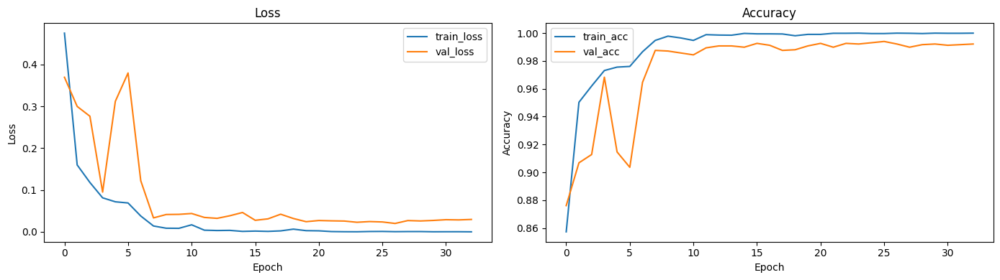

In [27]:
#  training curves Loss + Accuracy 

import matplotlib.pyplot as plt

# check if history exists
if 'history' not in globals():
    raise RuntimeError("history object not found. You must run training first.")

plt.figure(figsize=(14,4))

# ----- LOSS -----
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title("Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# ----- ACCURACY -----
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='train_acc')
plt.plot(history.history['val_accuracy'], label='val_acc')
plt.title("Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()


Loading final model: /kaggle/working/final_best_inceptionv3.keras

FINAL Classification Report:

                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot     0.9808    0.9961    0.9884       256
                        Tomato___Early_blight     0.9727    0.8917    0.9304       120
                         Tomato___Late_blight     0.9744    0.9913    0.9828       230
                           Tomato___Leaf_Mold     0.9829    1.0000    0.9914       115
                  Tomato___Septoria_leaf_spot     0.9814    0.9906    0.9860       213
Tomato___Spider_mites Two-spotted_spider_mite     0.9657    0.9752    0.9704       202
                         Tomato___Target_Spot     0.9699    0.9527    0.9612       169
       Tomato___Tomato_Yellow_Leaf_Curl_Virus     1.0000    0.9969    0.9984       643
                 Tomato___Tomato_mosaic_virus     0.9565    0.9778    0.9670        45
                             Tom

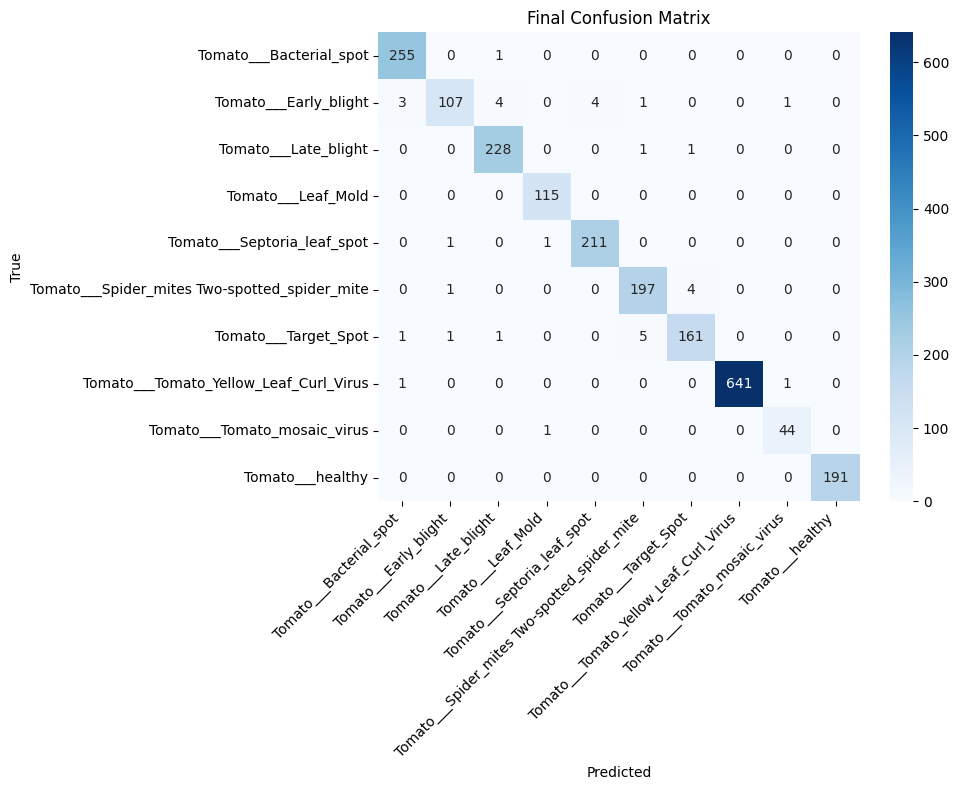

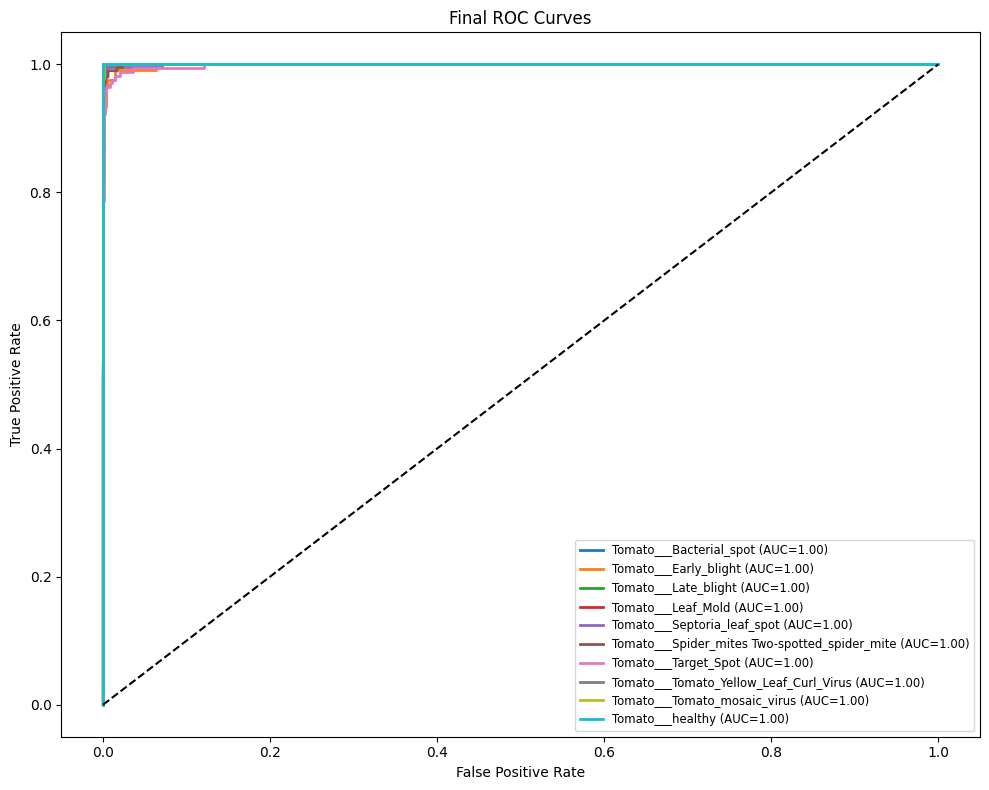

Final Misclassified Samples: 34


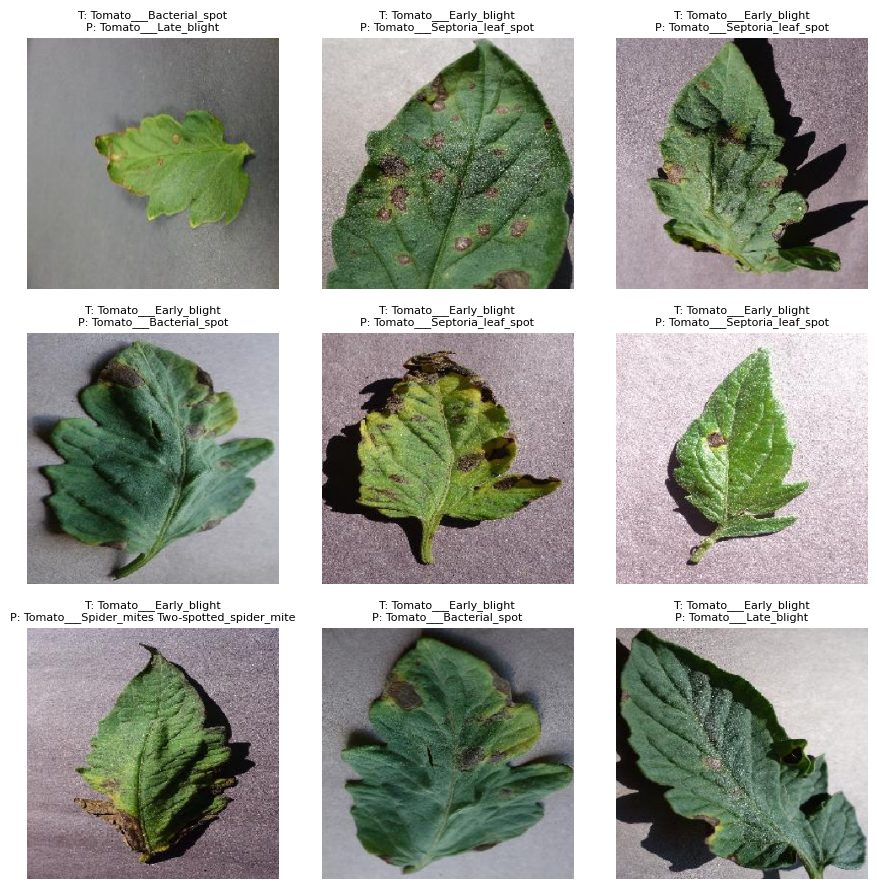

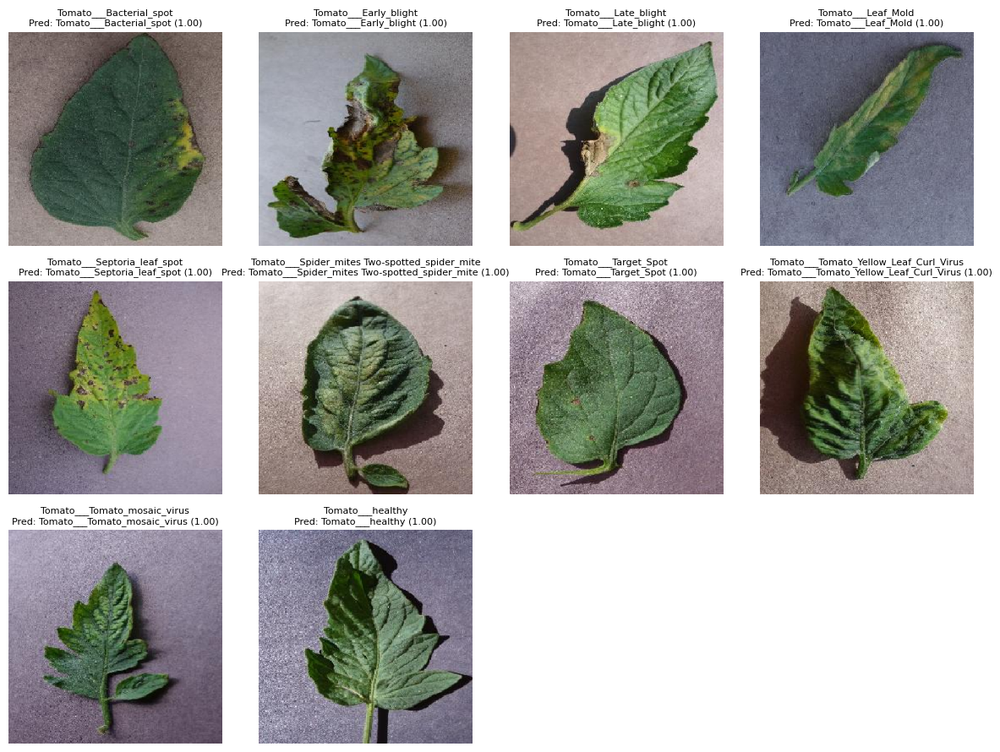

In [26]:
#   Final Evaluation using saved best model

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_curve, auc
from sklearn.preprocessing import label_binarize

MODEL_PATH = "/kaggle/working/final_best_inceptionv3.keras"

print("Loading final model:", MODEL_PATH)
model = tf.keras.models.load_model(MODEL_PATH)

# Predictions
y_proba = model.predict(test_gen, verbose=0)
y_pred  = np.argmax(y_proba, axis=1)
y_true  = test_gen.classes

# Class names
inv = {v:k for k,v in test_gen.class_indices.items()}
class_names = [inv[i] for i in range(len(inv))]

# -------- Classification Report --------
print("\nFINAL Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

macro_f1 = f1_score(y_true, y_pred, average='macro')
print(f"\nFINAL Macro F1 Score: {macro_f1:.4f}\n")


# -------- Confusion Matrix --------
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.title("Final Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


# -------- ROC Curves (One vs Rest) --------
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))

plt.figure(figsize=(10,8))
for i in range(len(class_names)):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_proba[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"{class_names[i]} (AUC={roc_auc:.2f})")

plt.plot([0,1],[0,1], 'k--')
plt.title("Final ROC Curves")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(fontsize="small")
plt.tight_layout()
plt.show()


# -------- Misclassified Samples (up to 9) --------
mis_idx = np.where(y_pred != y_true)[0]
print("Final Misclassified Samples:", len(mis_idx))

if len(mis_idx) > 0:
    plt.figure(figsize=(9,9))
    for i, idx in enumerate(mis_idx[:9]):
        ax = plt.subplot(3,3,i+1)
        fname = test_gen.filenames[idx]
        img_path = Path(test_gen.directory) / fname
        img = tf.keras.preprocessing.image.load_img(str(img_path), target_size=(299,299))
        arr = tf.keras.preprocessing.image.img_to_array(img) / 255.0
        plt.imshow(arr)
        plt.title(f"T: {inv[y_true[idx]]}\nP: {inv[y_pred[idx]]}", fontsize=8)
        plt.axis("off")
    plt.tight_layout()
    plt.show()


# -------- One Sample per Class Prediction --------
plt.figure(figsize=(12, 3 * (len(class_names)//4 + 1)))

for i, cls in enumerate(class_names):
    match = next((f for f in test_gen.filenames if f.startswith(cls + "/")), None)
    if match is None:
        continue

    img_path = Path(test_gen.directory) / match
    raw = tf.keras.preprocessing.image.load_img(str(img_path), target_size=(299,299))
    arr = tf.keras.preprocessing.image.img_to_array(raw).astype("uint8")

    x = np.expand_dims(arr.copy(), axis=0).astype("float32")
    x = tf.keras.applications.inception_v3.preprocess_input(x)

    proba = model.predict(x, verbose=0)[0]
    pred = np.argmax(proba)
    pred_name = inv[pred]

    ax = plt.subplot((len(class_names)+3)//4, 4, i+1)
    plt.imshow(arr)
    plt.title(f"{cls}\nPred: {pred_name} ({proba[pred]:.2f})", fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()


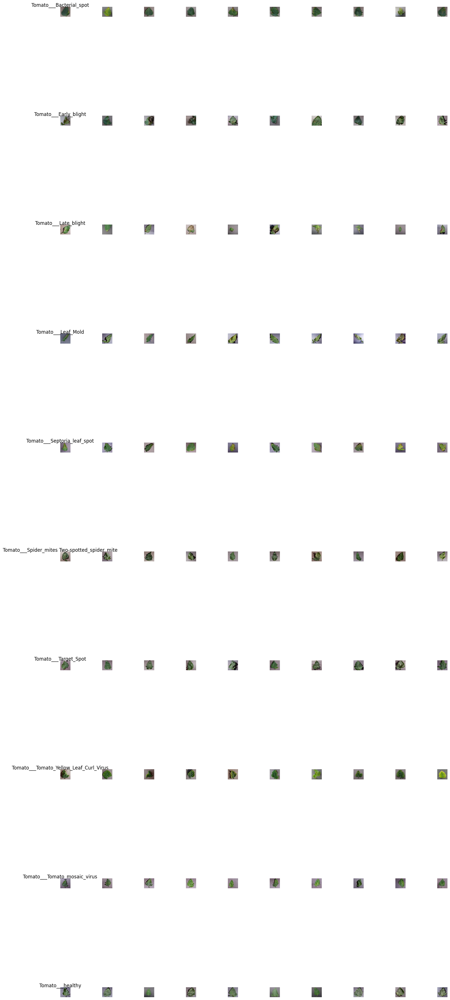

In [ ]:
# 10 sample images per class from test_gen  
 
import matplotlib.pyplot as plt
from pathlib import Path
import tensorflow as tf
import numpy as np

plt.figure(figsize=(16, 4 * len(test_gen.class_indices)))

inv_map = {v: k for k, v in test_gen.class_indices.items()}
class_names = [inv_map[i] for i in range(len(inv_map))]

row = 1

for cls in class_names:
    class_files = [f for f in test_gen.filenames if f.startswith(cls + "/")]

    # pick 10 images (or fewer if not available)
    sample_files = class_files[:10]

    # title row
    plt.subplot(len(class_names), 10, (row - 1) * 10 + 1)
    plt.text(0.5, 1.2, cls, ha='center', fontsize=12)
    plt.axis("off")

    for i, fname in enumerate(sample_files):
        img_path = Path(test_gen.directory) / fname
        img = tf.keras.preprocessing.image.load_img(str(img_path), target_size=(299, 299))
        arr = tf.keras.preprocessing.image.img_to_array(img).astype("uint8")

        plt.subplot(len(class_names), 10, (row - 1) * 10 + 1 + i)
        plt.imshow(arr)
        plt.axis("off")

    row += 1

plt.tight_layout()
plt.show()
